# Import the kaggle dataset : tinyml to detect human

In [35]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("xunkhangtan/tinyml-human-detection-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'tinyml-human-detection-dataset' dataset.
Path to dataset files: /kaggle/input/tinyml-human-detection-dataset


# print the first 20 pictures with label: 0 is not human, 1 is human.


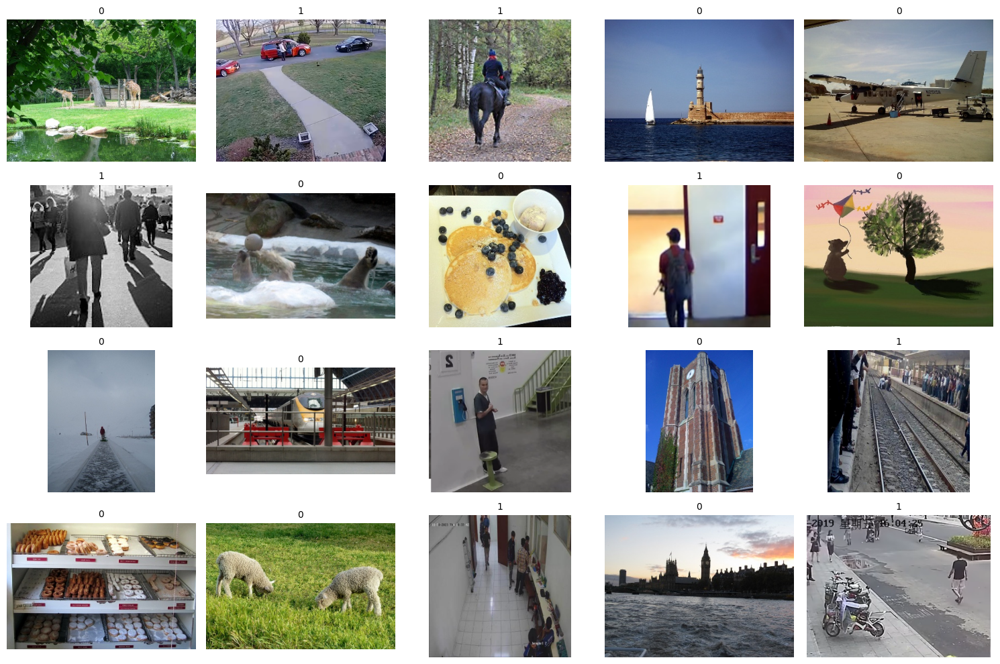

In [36]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import glob
import random

plt.figure(figsize=(15, 10))

image_dir = path  # kagglehub 下载的路径
image_paths = []

# search all pictures.
for ext in ('*.jpg', '*.jpeg', '*.png'):
    image_paths.extend(glob.glob(os.path.join(image_dir, '**', ext), recursive=True))

# random shuffle the pictures.
random.shuffle(image_paths)

num_images_to_display = 20

for i, img_path in enumerate(image_paths[:num_images_to_display]):
    img = Image.open(img_path)

    # ⭐ 取 class name（父目录名）
    class_name = os.path.basename(os.path.dirname(img_path))

    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.title(class_name, fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


# shuffle the datas and random choose them to train , val and test dataset

In [41]:
import os
import random
import shutil

random.seed(42)

# Correcting SRC_ROOT to use the path from kagglehub download
SRC_ROOT = os.path.join(path, "person_detection_validation")

DST_ROOT = "/content/dataset"

splits = {
    "train": 0.7,
    "val": 0.2,
    "test": 0.1
}

classes = ["0", "1"]

# create dir
for split in splits:
    for cls in classes:
        os.makedirs(os.path.join(DST_ROOT, split, cls), exist_ok=True)

# copy and divide dataset
for cls in classes:
    img_dir = os.path.join(SRC_ROOT, cls)
    images = [f for f in os.listdir(img_dir) if f.lower().endswith((".jpg", ".png"))]
    random.shuffle(images)

    n = len(images)
    train_end = int(n * splits["train"])
    val_end = train_end + int(n * splits["val"])

    split_map = {
        "train": images[:train_end],
        "val": images[train_end:val_end],
        "test": images[val_end:]
    }

    for split, files in split_map.items():
        for img in files:
            shutil.copy(
                os.path.join(img_dir, img),
                os.path.join(DST_ROOT, split, cls, img)
            )

print("dataset is ready")

FileNotFoundError: [Errno 2] No such file or directory: '/content/dataset/0/person_detection_validation/0'

In [40]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

IMG_SIZE = (96, 96)
BATCH_SIZE = 32

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

# class name
print("classes name:", train_ds.class_names)

Found 6493 files belonging to 2 classes.
Found 2577 files belonging to 2 classes.
Found 1359 files belonging to 2 classes.
classes name: ['0', '1']


# MobileNet as basemodel

In [21]:
base_model = MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation="relu")(x)
output = Dense(1, activation="sigmoid")(x)

model = Model(inputs=base_model.input, outputs=output)

model.compile(
    optimizer="adam",
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [42]:
print(train_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [43]:
print(val_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 96, 96, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>


In [47]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications

# 1. 基础配置 (根据你数据集的输入尺寸调整)
# 将 IMG_SIZE 从 (96, 96) 修改为 (224, 224)，以匹配 train_ds 的输入尺寸
IMG_SIZE = (224, 224) # 确保与预处理一致
CHANNELS = 3        # MobileNetV2 需要 3 通道 (RGB)
input_shape = IMG_SIZE + (CHANNELS,)

# 2. 构建基础模型 (MobileNetV2)
# weights='imagenet' 表示使用预训练权重
base_model = applications.MobileNetV2(input_shape=input_shape,
                                     include_top=False,
                                     weights='imagenet')

# 3. 冻结前几层 (迁移学习的关键)
# 这里我们冻结基础模型的所有层，只训练我们添加的顶层
base_model.trainable = False

# 4. 修改最后几层进行迁移学习
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.2), # 防止过拟合
    layers.Dense(1, activation='sigmoid') # 二分类：是人/不是人
])

# 5. 编译模型
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

model.summary()

history = model.fit(train_ds, epochs=10, validation_data=val_ds)

# 7. 导出并保存模型 (H5格式)
model.save('human_detection_mobilenet.h5')

# 8. 转换为部署到 ESP32 必需的 TFLite 格式 (带量化)
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

# 注意：为了进一步压缩模型以适应 ESP32，建议进行全整数量化
# 这通常需要一个代表性数据集 (representative_dataset)
tflite_model = converter.convert()

# 保存 TFLite 模型
with open('model_quantized.tflite', 'wb') as f:
    f.write(tflite_model)

print("模型已转换并保存为 model_quantized.tflite")

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

Epoch 1/10


ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "mobilenetv2_1.00_224" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(None, 96, 96, 3)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(None, 96, 96, 3), dtype=float32)
  • training=True
  • mask=None
  • kwargs=<class 'inspect._empty'>

In [49]:
import tensorflow as tf

# 加载你的模型
model = tf.keras.models.load_model('human_detection_mobilenet.h5')

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

# 必须设置量化以适应 ESP32
def representative_data_gen():
    for input_value in test_ds.take(100):
        # 提取图像数据，通常是 batch_size 为 1 的第一部分
        yield [tf.cast(input_value[0], tf.float32)]

converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.inference_input_type = tf.int8
converter.inference_output_type = tf.int8

tflite_model = converter.convert()
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

Saved artifact at '/tmp/tmpf5nw09_i'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_6')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  132515042622736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132515042622544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132515042623120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132515042623312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132515042622928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132513047068752: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132513047069328: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132513047069520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132513047069136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132513047070672: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1325130470700

/usr/local/lib/python3.12/dist-packages/tensorflow/lite/python/convert.py:854: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn(


RuntimeError: Attempting to resize dimension 1 of tensor 0 with value 224 to 96. ResizeInputTensorStrict only allows mutating unknown dimensions identified by -1.

# Tensorboard

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import callbacks
import datetime

logdir = "logs/person_cls/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_cb = callbacks.TensorBoard(
    log_dir=logdir,
    histogram_freq=1
)

earlystop_cb = callbacks.EarlyStopping(
    patience=5,
    restore_best_weights=True
)

checkpoint_cb = callbacks.ModelCheckpoint(
    "best_model.h5",
    save_best_only=True
)


In [ ]:
logdir = "logs/person_cls/"
%load_ext tensorboard
%tensorboard --logdir {logdir}

<IPython.core.display.Javascript object>

#  Choose a picture and use the model to predicit.

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


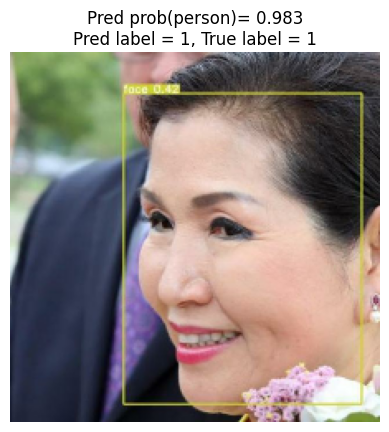

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# choose a batch
for images, labels in test_ds.take(1):
    images = images.numpy()
    labels = labels.numpy()

# random choose a picture
idx = np.random.randint(0, images.shape[0])
img = images[idx]
true_label = labels[idx]
pred = model.predict(img[np.newaxis, ...])[0][0]

pred_label = 1 if pred >= 0.5 else 0

plt.imshow(img.astype("uint8"))
plt.axis("off")

plt.title(
    f"Pred prob(person)= {pred:.3f}\n"
    f"Pred label = {pred_label}, True label = {true_label}"
)

plt.show()


# TinyML